How to make the most(money) from your Airbnb listing? (Seattle edition)

For this project, we analyze the airbnb listings data from Seattle to answer a few question around what makes a great airbnb property and how to earn the most from your vacation rental home.


First we are going to import all the relevant libraries and read in the two datasets:
1. listings.csv ( contains the specifications of the various airbnb listings in seattle)
2. calendar.csv ( contains one year of availability and pricing data for each of the listings in the above files)


In [1]:
import pandas as pd
import numpy as np
import pandas_profiling
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestRegressor

listings=pd.read_csv('./listings.csv')
calendar=pd.read_csv('./calendar.csv')

In [2]:
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,...,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",...,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazing water view,New modern house built in 2013. Spectacular s...,"Our house is modern, light and fresh with a wa...",New modern house built in 2013. Spectacular s...,none,Upper Queen Anne is a charming neighborhood fu...,...,10.0,f,NaN,WASHINGTON,f,strict,f,f,2,1.15
3,7421966,https://www.airbnb.com/rooms/7421966,20160104002432,2016-01-04,Queen Anne Chateau,A charming apartment that sits atop Queen Anne...,NaN,A charming apartment that sits atop Queen Anne...,none,NaN,...,NaN,f,NaN,WASHINGTON,f,flexible,f,f,1,NaN
4,278830,https://www.airbnb.com/rooms/278830,20160104002432,2016-01-04,Charming craftsman 3 bdm house,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,Cozy family craftman house in beautiful neighb...,none,We are in the beautiful neighborhood of Queen ...,...,9.0,f,NaN,WASHINGTON,f,strict,f,f,1,0.89


In [3]:
calendar.head()

,listing_id,date,available,price
0,241032,2016-01-04,t,$85.00
1,241032,2016-01-05,t,$85.00
2,241032,2016-01-06,f,NaN
3,241032,2016-01-07,f,NaN
4,241032,2016-01-08,f,NaN


Next we use the pandas profiling library to perform a basic EDA on all the attributes of the datasets.
More details on pandas profiling can be found here: https://pandas-profiling.github.io/pandas-profiling/docs/ .
The profiling report helps us pick and prepare the relevant attributes for the questions we want to address

In [4]:
listings.profile_report()

In [5]:
calendar.profile_report()

We are going to use this data to better understand the following:
1. Which are the top neighbourhoods in Seattle for setting up an Airbnb?
2. Do user reviews drastically affect the success of your Airbnb?
3. Do bigger houses always fetch the maximum value? What other specifications can help you increase your listing price?


We are going to use to calendar data to figure out the occupancy rate (how many days in the year was the house booked) and use it as the success criteria for a listing.


In [6]:
#Define the occupied status to be 1 when booked
calendar['occupied']= np.where(calendar['available']=='f', 1, 0)

In [7]:
#Aggregate the occupied flag to find the overall occupancy rate for each listing
calendar_aggregates= calendar.groupby(['listing_id']).agg({'date':'count','occupied':sum}).reset_index()

In [8]:
calendar_aggregates.columns = ['listing_id','#_days_listed','#_days_occupied']

We are now going to create the final dataset to be used in our analysis by merging the listing dataset with the calendar aggregate by using the listing id as the key

In [9]:
dataset=listings.merge(calendar_aggregates,left_on='id',right_on='listing_id',how='inner')

In [10]:
#Get the occupancy rate between 0 to 100 % for a listing
dataset['occupancy_rate']=dataset['#_days_occupied']/dataset['#_days_listed']*100

In [11]:
#Get the listing price by cleaning $ and other symbols 
dataset['price_cleansed']=dataset['price'].apply(lambda x: float(str(x)[1:].replace(',','')) if pd.notnull(x) else 0)

In [12]:
#Calculate the average earning per day for each listing. This can be used as an alternate success criteria
dataset['avg_earning_per_day']=(dataset['#_days_occupied']*dataset['price_cleansed'])/dataset['#_days_listed']

1. TOP NEIGHBOURHOODS

We plot the occupancy rate and average earning per day by neighbourhood to figure out which are the top ones to setup and airbnb

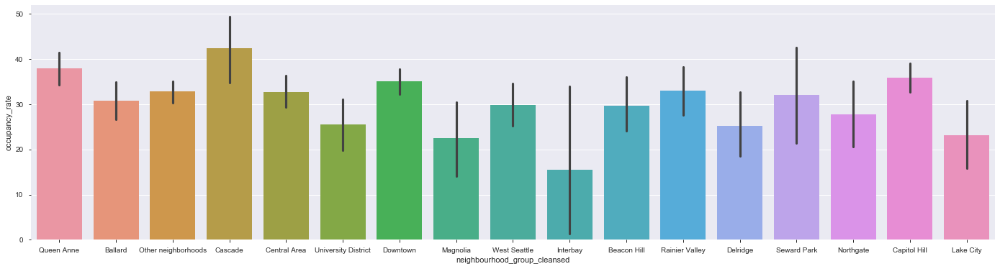

In [13]:

plt.figure(figsize=(24, 6))
ax = sns.barplot(x="neighbourhood_group_cleansed", y="occupancy_rate", data=dataset)

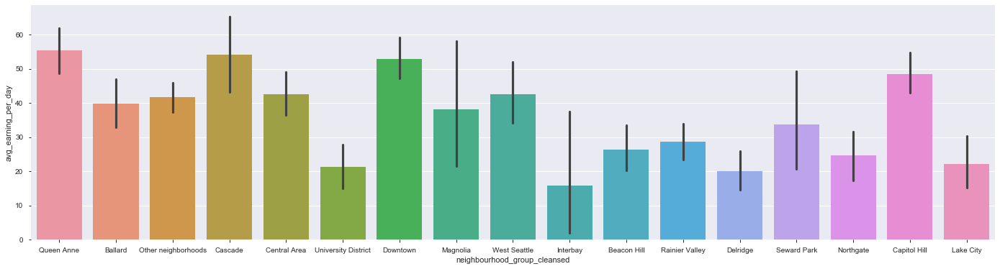

In [14]:
plt.figure(figsize=(24, 6))
ax = sns.barplot(x="neighbourhood_group_cleansed", y="avg_earning_per_day", data=dataset)

The top 3 areas in Seattle to own an airbnb are:
1. Cascade
2. Queen Anne
4. Capitol Hill

2. REVIEW IMPACT

We pick all the user review score attributes from the dataset to figure out how much it impacts the success of a listing

In [15]:
review_specs=['number_of_reviews','review_scores_accuracy','review_scores_checkin','review_scores_cleanliness','review_scores_communication','review_scores_location','review_scores_rating','review_scores_value']

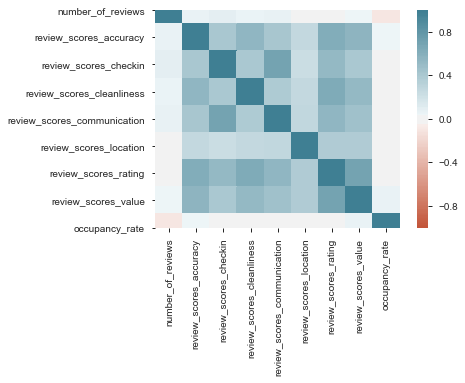

In [16]:
ax = sns.heatmap(
    dataset[review_specs+['occupancy_rate']].corr(), 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

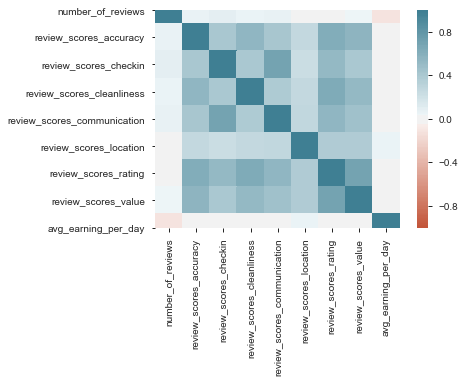

In [17]:
ax = sns.heatmap(
    dataset[review_specs+['avg_earning_per_day']].corr(), 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

The white boxes in the correlation plot indicate that the review scores do not really impact the occupany rate or the average earnings per day for a listing. The location score has some positive correlation (all the more reason to focus on the neighbourhoods we found above!!)

3. PRICING

Lets find out the main factors that contribute to the price.

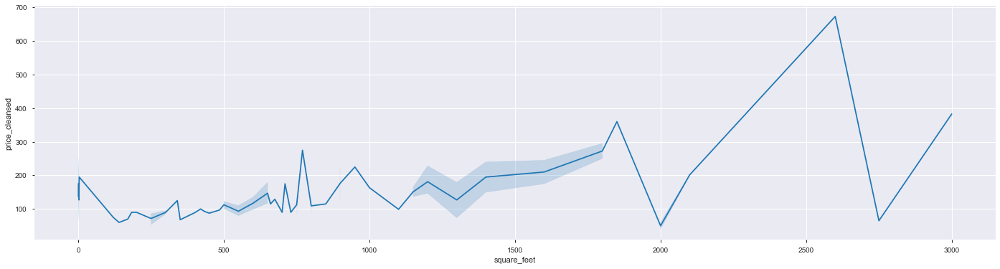

In [18]:
#check for property size
plt.figure(figsize=(24, 6))
ax = sns.lineplot(x="square_feet", y="price_cleansed", data=dataset)

As seen in the plot above, price is not directly decided by the size of the property. We will now create a machine learning model to find out the most important factors in determining the price of an airbnb listing

We pick all the relevant attributes from the profiling done above and divide them into various categories

In [19]:
property_specs= ['accommodates','property_type','bathrooms','bedrooms','guests_included','is_location_exact','neighbourhood_group_cleansed','room_type','square_feet']
host_specs=['calculated_host_listings_count','host_identity_verified','host_is_superhost','host_response_rate','host_response_time']

In [20]:
def get_amenities_list(raw_amenities):
    '''
    INPUT
    raw_amenities - pandas series 
    
    OUTPUT
    amenities - set of values for amenities available in the airbnb listing
    
    This function cleans raw amenities column using the following steps to produce amenities:
    1. Create a set from all raw amenity strings
    2. For each unique string, clean extra characters to extract amenity values
    3. Append all the amenity values to a set
    '''
    amenities=set()
    raw_amenities_values=set(raw_amenities)
    for value_string in raw_amenities_values:
        values= value_string.split('{')[1].split('}')[0].replace('"','').split(',')
        amenities=amenities|set(values)
    return amenities

In [21]:
amenities= get_amenities_list(dataset['amenities'])

In [22]:
amenities.remove('')

In [23]:
def check_amenity(amenity_string,amenity_to_check):
    '''
    INPUT
    amenity_string - raw string containing amenities for a listing
    amenity_to_check - the amenity which we are checking for presence in the listing
    
    OUTPUT
    value - 1 for present and 0 for absent
    
    This function checks for the presence of a specfic amenity in the amenity string for a listing
    '''
    if amenity_to_check in amenity_string:
        return 1
    return 0

In [24]:
for amenity in amenities:
    dataset[amenity]=dataset['amenities'].apply(check_amenity,args=(amenity,))

In [25]:
amenity_specs=['Fire Extinguisher','Gym','TV','Elevator in Building','Heating','Indoor Fireplace',
               'Carbon Monoxide Detector','Air Conditioning','Hair Dryer','Other pet(s)','Safety Card',
 'Wireless Internet','24-Hour Check-in','Cat(s)','Laptop Friendly Workspace','Hot Tub','Washer / Dryer',
 'Kitchen','Pets Allowed','Shampoo','Breakfast','Hangers','Smoke Detector','Doorman','First Aid Kit',
 'Pets live on this property','Family/Kid Friendly','Suitable for Events','Dryer','Free Parking on Premises',
 'Cable TV','Dog(s)','Washer','Essentials','Wheelchair Accessible','Lock on Bedroom Door','Pool','Iron',
 'Internet','Smoking Allowed','Buzzer/Wireless Intercom']

In [26]:
def clean_data(df,target="price_cleansed"):
    '''
    INPUT
    df - pandas dataframe 
    target - variable to predict for using the machine learning model
    
    OUTPUT
    X - A matrix holding all of the variables you want to consider when predicting the response
    y - the corresponding response vector
    
    Perform to obtain the correct X and y objects
    This function cleans df using the following steps to produce X and y:
    1. Drop all the rows with no target value
    2. Create X as all the columns that are not the target column
    3. Create y as the target column
    5. For each numeric variable in X, fill the column with the mean value of the column.
    6. Create dummy columns for all the categorical variables in X, drop the original columns
    '''
    df = df.dropna(subset=[target],axis=0)
    X= df.drop([target],axis=1)
    y= df[[target]]
    
    num_vars = X.select_dtypes(include=['float', 'int']).columns
    for col in num_vars:
        X[col].fillna((X[col].mean()), inplace=True)
        
    cat_vars = X.select_dtypes(include=['object']).copy().columns
    for var in  cat_vars:
        # for each cat add dummy var, drop original column
        X = pd.concat([X.drop(var, axis=1), pd.get_dummies(X[var], prefix=var, prefix_sep='_', drop_first=True)], axis=1)
    
    return X, y

In [27]:

specs_to_use=property_specs+host_specs+amenity_specs
target='price_cleansed'

In [28]:
dataset_trimmed=dataset[specs_to_use+[target]]

In [29]:
dataset_trimmed_clean= clean_data(dataset_trimmed,target)

In [30]:
X,y=dataset_trimmed_clean[0],dataset_trimmed_clean[1]

In [31]:
#Use sklearn train test split to create a out of sample test set for model evaluations
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

In [32]:
# Use linear regression to explain the dataset
lm_model = LinearRegression(normalize=True)
lm_model.fit(X_train, y_train)
y_test_preds = lm_model.predict(X_test)
y_train_preds = lm_model.predict(X_train)
print(r2_score(y_test, y_test_preds))
print(r2_score(y_train, y_train_preds))

-1.0381223091368806e+24
0.6022861522146925


A linear model is not a very good fit for this data. So we turn to a more complex model to check if the results improve

In [33]:
rf_model= RandomForestRegressor(n_estimators=100,min_samples_split=12)
rf_model.fit(X_train, y_train)
y_test_preds = rf_model.predict(X_test)
y_train_preds = rf_model.predict(X_train)
print(r2_score(y_test, y_test_preds))
print(r2_score(y_train, y_train_preds))

0.6044896561708213
0.814857481378599


The random forest regressor gives us a lot better results. We use this model to find the top features defining the price

In [34]:
feature_df =  pd.DataFrame(list(zip(list(X.columns), list(rf_model.feature_importances_))), 
               columns =['Name', 'importance'])

In [35]:
feature_df.sort_values(['importance'],ascending=False)[:20]

,Name,importance
2,bedrooms,0.435692
1,bathrooms,0.102895
0,accommodates,0.081510
79,room_type_Private room,0.035366
68,neighbourhood_group_cleansed_Downtown,0.027402
80,room_type_Shared room,0.020739
3,guests_included,0.018032
74,neighbourhood_group_cleansed_Queen Anne,0.012714
30,First Aid Kit,0.011279
64,neighbourhood_group_cleansed_Capitol Hill,0.010469


The biggest factor contributing to the price is the number of bedrooms and bathrooms and the people you can fit in the house.

The top amenities that can boost your listing are:
1. Pool
2. First Aid Kit
3. Kitchen
4. Hot Tub
5. TV
6. Gym